<a href="https://colab.research.google.com/github/Ranjani94/Advanced_Deep_Learning/blob/master/Assignment_7/Catboost.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Simple catboost example using kaggle dataset

CatBoost is an open-source gradient boosting on decision trees library developed by Yandex. CatBoost can be used for solving problems, such as:

- classification (binary, multi-class)
- regression
- ranking

In [1]:
!pip install catboost==0.14.2

     |████████████████████████████████| 60.6MB 54kB/s 


In [2]:
import catboost
from catboost import CatBoostClassifier

In [3]:
from catboost import datasets

train_df, test_df = datasets.amazon() 
train_df.shape, test_df.shape

((32769, 10), (58921, 10))

In [4]:
train_df.head()

,ACTION,RESOURCE,MGR_ID,ROLE_ROLLUP_1,ROLE_ROLLUP_2,ROLE_DEPTNAME,ROLE_TITLE,ROLE_FAMILY_DESC,ROLE_FAMILY,ROLE_CODE
0,1,39353,85475,117961,118300,123472,117905,117906,290919,117908
1,1,17183,1540,117961,118343,123125,118536,118536,308574,118539
2,1,36724,14457,118219,118220,117884,117879,267952,19721,117880
3,1,36135,5396,117961,118343,119993,118321,240983,290919,118322
4,1,42680,5905,117929,117930,119569,119323,123932,19793,119325


In [5]:
test_df.head()

,id,RESOURCE,MGR_ID,ROLE_ROLLUP_1,ROLE_ROLLUP_2,ROLE_DEPTNAME,ROLE_TITLE,ROLE_FAMILY_DESC,ROLE_FAMILY,ROLE_CODE
0,1,78766,72734,118079,118080,117878,117879,118177,19721,117880
1,2,40644,4378,117961,118327,118507,118863,122008,118398,118865
2,3,75443,2395,117961,118300,119488,118172,301534,249618,118175
3,4,43219,19986,117961,118225,118403,120773,136187,118960,120774
4,5,42093,50015,117961,118343,119598,118422,300136,118424,118425


In [6]:
y = train_df['ACTION']
X = train_df.drop(columns='ACTION', axis = 1)

In [7]:
X_test = test_df.drop(columns='id')

In [8]:
SEED = 1

In [9]:
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.25, random_state=SEED)

In [10]:
%%time

params = {'loss_function':'Logloss', # objective function
          'eval_metric':'AUC', # metric
          'verbose': 200, # output to stdout info about training process every 200 iterations
          'random_seed': SEED
         }
cbc_1 = CatBoostClassifier(**params)
cbc_1.fit(X_train, y_train, # data to train on (required parameters, unless we provide X as a pool object, will be shown below)
          eval_set=(X_valid, y_valid), # data to validate on
          use_best_model=True, # True if we don't want to save trees created after iteration with the best validation score
          plot=True # True for visualization of the training process (it is not shown in a published kernel - try executing this code)
         );

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.109208
0:	test: 0.5705673	best: 0.5705673 (0)	total: 150ms	remaining: 2m 30s
200:	test: 0.8019665	best: 0.8019665 (200)	total: 13.1s	remaining: 52s
400:	test: 0.8192856	best: 0.8196635 (370)	total: 25.3s	remaining: 37.8s
600:	test: 0.8250297	best: 0.8250297 (600)	total: 36.5s	remaining: 24.2s
800:	test: 0.8278111	best: 0.8278111 (800)	total: 47.5s	remaining: 11.8s
999:	test: 0.8294561	best: 0.8294561 (999)	total: 58.4s	remaining: 0us

bestTest = 0.8294560756
bestIteration = 999

CPU times: user 1min 24s, sys: 25.2 s, total: 1min 49s
Wall time: 59 s


In [11]:
cat_features = list(range(X.shape[1]))
print(cat_features)

[0, 1, 2, 3, 4, 5, 6, 7, 8]


In [12]:
cat_features_names = X.columns # here we specify names of categorical features
cat_features = [X.columns.get_loc(col) for col in cat_features_names]
print(cat_features)

[0, 1, 2, 3, 4, 5, 6, 7, 8]


In [13]:
condition = True # here we specify what condition should be satisfied only by the names of categorical features
cat_features_names = [col for col in X.columns if condition]
cat_features = [X.columns.get_loc(col) for col in cat_features_names]
print(cat_features)

[0, 1, 2, 3, 4, 5, 6, 7, 8]


In [14]:
%%time

params = {'loss_function':'Logloss',
          'eval_metric':'AUC',
          'cat_features': cat_features,
          'verbose': 200,
          'random_seed': SEED
         }
cbc_2 = CatBoostClassifier(**params)
cbc_2.fit(X_train, y_train,
          eval_set=(X_valid, y_valid),
          use_best_model=True,
          plot=True
         );

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.109208
0:	test: 0.5638126	best: 0.5638126 (0)	total: 203ms	remaining: 3m 22s
200:	test: 0.8946105	best: 0.8946136 (198)	total: 21.6s	remaining: 1m 25s
400:	test: 0.8968715	best: 0.8970690 (338)	total: 44.5s	remaining: 1m 6s
600:	test: 0.8963669	best: 0.8971296 (412)	total: 1m 7s	remaining: 44.7s
800:	test: 0.8969519	best: 0.8971296 (412)	total: 1m 30s	remaining: 22.4s
999:	test: 0.8964540	best: 0.8971296 (412)	total: 1m 52s	remaining: 0us

bestTest = 0.8971296371
bestIteration = 412

Shrink model to first 413 iterations.
CPU times: user 3min 5s, sys: 27.3 s, total: 3min 32s
Wall time: 1min 52s


In [15]:
%%time

params = {'loss_function':'Logloss',
          'eval_metric':'AUC',
          'cat_features': cat_features,
          'early_stopping_rounds': 200,
          'verbose': 200,
          'random_seed': SEED
         }
cbc_2 = CatBoostClassifier(**params)
cbc_2.fit(X_train, y_train, 
          eval_set=(X_valid, y_valid), 
          use_best_model=True, 
          plot=True
         );

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.109208
0:	test: 0.5638126	best: 0.5638126 (0)	total: 155ms	remaining: 2m 34s
200:	test: 0.8946105	best: 0.8946136 (198)	total: 21.3s	remaining: 1m 24s
400:	test: 0.8968715	best: 0.8970690 (338)	total: 44.1s	remaining: 1m 5s
600:	test: 0.8963669	best: 0.8971296 (412)	total: 1m 6s	remaining: 43.9s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.8971296371
bestIteration = 412

Shrink model to first 413 iterations.
CPU times: user 1min 51s, sys: 18 s, total: 2min 9s
Wall time: 1min 7s


In [16]:
%%time

params = {'loss_function':'Logloss',
          'eval_metric':'AUC',
          'cat_features': cat_features,
          'task_type': 'GPU',
          'verbose': 200,
          'random_seed': SEED
         }
cbc_3 = CatBoostClassifier(**params)
cbc_3.fit(X_train, y_train,
          eval_set=(X_valid, y_valid), 
          use_best_model=True,
          plot=True
         );

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.109208
0:	learn: 0.7457180	test: 0.7930745	best: 0.7930745 (0)	total: 107ms	remaining: 1m 46s
200:	learn: 0.8735813	test: 0.8918360	best: 0.8925326 (135)	total: 12.4s	remaining: 49.4s
400:	learn: 0.8808323	test: 0.8928896	best: 0.8929950 (387)	total: 24.7s	remaining: 36.9s
600:	learn: 0.8897315	test: 0.8926569	best: 0.8933347 (466)	total: 36.8s	remaining: 24.4s
800:	learn: 0.8966494	test: 0.8930740	best: 0.8933347 (466)	total: 49.3s	remaining: 12.3s
999:	learn: 0.9015048	test: 0.8934347	best: 0.8934853 (979)	total: 1m 1s	remaining: 0us
bestTest = 0.8934853375
bestIteration = 979
Shrink model to first 980 iterations.
CPU times: user 1min 5s, sys: 20.4 s, total: 1min 26s
Wall time: 1min 3s


In [17]:
%%time

params = {'loss_function':'Logloss',
          'eval_metric':'AUC',
          'cat_features': cat_features,
          'task_type': 'GPU',
          'border_count': 32,
          'verbose': 200,
          'random_seed': SEED
         }
cbc_4 = CatBoostClassifier(**params)
cbc_4.fit(X_train, y_train, 
          eval_set=(X_valid, y_valid), 
          use_best_model=True, 
          plot=True
         );

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.109208
0:	learn: 0.7457180	test: 0.7930745	best: 0.7930745 (0)	total: 61.4ms	remaining: 1m 1s
200:	learn: 0.8735813	test: 0.8918360	best: 0.8925326 (135)	total: 12.3s	remaining: 49.1s
400:	learn: 0.8808323	test: 0.8928896	best: 0.8929950 (387)	total: 24.6s	remaining: 36.7s
600:	learn: 0.8897315	test: 0.8926569	best: 0.8933347 (466)	total: 36.8s	remaining: 24.5s
800:	learn: 0.8966494	test: 0.8930740	best: 0.8933347 (466)	total: 49.2s	remaining: 12.2s
999:	learn: 0.9007980	test: 0.8929231	best: 0.8933347 (466)	total: 1m 1s	remaining: 0us
bestTest = 0.8933347166
bestIteration = 466
Shrink model to first 467 iterations.
CPU times: user 1min 5s, sys: 20 s, total: 1min 25s
Wall time: 1min 3s


In [18]:
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [19]:
np.random.seed(SEED)
noise_cols = [f'noise_{i}' for i in range(5)]
for col in noise_cols:
    X_train[col] = y_train * np.random.rand(X_train.shape[0])
    X_valid[col] = np.random.rand(X_valid.shape[0])

In [20]:
X_train.head()

,RESOURCE,MGR_ID,ROLE_ROLLUP_1,ROLE_ROLLUP_2,ROLE_DEPTNAME,ROLE_TITLE,ROLE_FAMILY_DESC,ROLE_FAMILY,ROLE_CODE,noise_0,noise_1,noise_2,noise_3,noise_4
16773,27798,1350,117961,118052,122938,117905,117906,290919,117908,0.417022,0.097850,0.665600,0.979025,0.491624
23491,80701,4571,117961,118225,119924,118685,279443,308574,118687,0.720324,0.855900,0.311763,0.929346,0.391708
32731,34039,5113,117961,118300,119890,119433,133686,118424,119435,0.000114,0.287838,0.896624,0.704050,0.606467
7855,42085,4733,118290,118291,120126,118980,166203,118295,118982,0.302333,0.264320,0.482195,0.028493,0.182570
16475,16358,6046,117961,118446,120317,307024,306404,118331,118332,0.146756,0.022876,0.009307,0.726750,0.623357


In [21]:
%%time

params = {'loss_function':'Logloss',
          'eval_metric':'AUC',
          'cat_features': cat_features,
          'verbose': 200,
          'random_seed': SEED
         }
cbc_5 = CatBoostClassifier(**params)
cbc_5.fit(X_train, y_train, 
          eval_set=(X_valid, y_valid), 
          use_best_model=True, 
          plot=True
         );

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.109208
0:	test: 0.5004300	best: 0.5004300 (0)	total: 277ms	remaining: 4m 36s
200:	test: 0.5370327	best: 0.5593408 (1)	total: 16.2s	remaining: 1m 4s
400:	test: 0.5357266	best: 0.5593408 (1)	total: 36.5s	remaining: 54.6s
600:	test: 0.5349589	best: 0.5593408 (1)	total: 56.3s	remaining: 37.4s
800:	test: 0.5343612	best: 0.5593408 (1)	total: 1m 16s	remaining: 19s
999:	test: 0.5339080	best: 0.5593408 (1)	total: 1m 36s	remaining: 0us

bestTest = 0.5593407637
bestIteration = 1

Shrink model to first 2 iterations.
CPU times: user 2min 47s, sys: 16.4 s, total: 3min 3s
Wall time: 1min 37s


In [22]:
ignored_features = list(range(X_train.shape[1] - 5, X_train.shape[1]))
print(ignored_features)

[9, 10, 11, 12, 13]


In [23]:
%%time

params = {'loss_function':'Logloss',
          'eval_metric':'AUC',
          'cat_features': cat_features,
          'ignored_features': ignored_features,
          'early_stopping_rounds': 200,
          'verbose': 200,
          'random_seed': SEED
         }
cbc_6 = CatBoostClassifier(**params)
cbc_6.fit(X_train, y_train, 
          eval_set=(X_valid, y_valid), 
          use_best_model=True, 
          plot=True
         );

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.109208
0:	test: 0.5638126	best: 0.5638126 (0)	total: 185ms	remaining: 3m 4s
200:	test: 0.8946105	best: 0.8946136 (198)	total: 21.1s	remaining: 1m 23s
400:	test: 0.8968715	best: 0.8970690 (338)	total: 43.6s	remaining: 1m 5s
600:	test: 0.8963669	best: 0.8971296 (412)	total: 1m 5s	remaining: 43.4s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.8971296371
bestIteration = 412

Shrink model to first 413 iterations.
CPU times: user 1min 50s, sys: 17.6 s, total: 2min 7s
Wall time: 1min 7s


In [24]:
X_train = X_train.drop(columns=noise_cols)
X_valid = X_valid.drop(columns=noise_cols)

In [25]:
from catboost import Pool

train_data = Pool(data=X_train,
                  label=y_train,
                  cat_features=cat_features
                 )

valid_data = Pool(data=X_valid,
                  label=y_valid,
                  cat_features=cat_features
                 )

In [26]:
%%time

params = {'loss_function':'Logloss',
          'eval_metric':'AUC',
#           'cat_features': cat_features, # we don't need to specify this parameter as 
#                                           pool object contains info about categorical features
          'early_stopping_rounds': 200,
          'verbose': 200,
          'random_seed': SEED
         }

cbc_7 = CatBoostClassifier(**params)
cbc_7.fit(train_data, # instead of X_train, y_train
          eval_set=valid_data, # instead of (X_valid, y_valid)
          use_best_model=True, 
          plot=True
         );

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.109208
0:	test: 0.5638126	best: 0.5638126 (0)	total: 212ms	remaining: 3m 31s
200:	test: 0.8946105	best: 0.8946136 (198)	total: 21.3s	remaining: 1m 24s
400:	test: 0.8968715	best: 0.8970690 (338)	total: 43.7s	remaining: 1m 5s
600:	test: 0.8963669	best: 0.8971296 (412)	total: 1m 5s	remaining: 43.6s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.8971296371
bestIteration = 412

Shrink model to first 413 iterations.
CPU times: user 1min 50s, sys: 17.6 s, total: 2min 8s
Wall time: 1min 7s


In [27]:
from catboost import cv

In [28]:
%%time

params = {'loss_function':'Logloss',
          'eval_metric':'AUC',
          'verbose': 200,
          'random_seed': SEED
         }

all_train_data = Pool(data=X,
                      label=y,
                      cat_features=cat_features
                     )

scores = cv(pool=all_train_data,
            params=params, 
            fold_count=4,
            seed=SEED, 
            shuffle=True,
            stratified=True, # if True the folds are made by preserving the percentage of samples for each class
            plot=True
           )

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5381441	best: 0.5381441 (0)
200:	test: 0.8840480	best: 0.8840499 (199)
400:	test: 0.8861661	best: 0.8861661 (400)
600:	test: 0.8871367	best: 0.8871411 (597)
800:	test: 0.8880557	best: 0.8880674 (795)
999:	test: 0.8883886	best: 0.8883948 (998)	total: 7m 21s	remaining: 0us
CPU times: user 12min 11s, sys: 2min 4s, total: 14min 16s
Wall time: 7min 22s


In [29]:
cbc_7.get_feature_importance(prettified=True)

[('RESOURCE', 22.74697311986245),
 ('MGR_ID', 16.444913675276734),
 ('ROLE_DEPTNAME', 13.742090613788083),
 ('ROLE_TITLE', 12.205839446269668),
 ('ROLE_ROLLUP_2', 11.002091347964909),
 ('ROLE_FAMILY_DESC', 8.822790049056959),
 ('ROLE_FAMILY', 6.152550172699604),
 ('ROLE_ROLLUP_1', 5.196904782818365),
 ('ROLE_CODE', 3.6858467922632294)]

In [30]:
import pandas as pd

feature_importance_df = pd.DataFrame(cbc_7.get_feature_importance(prettified=True), columns=['feature', 'importance'])
feature_importance_df

,feature,importance
0,RESOURCE,22.746973
1,MGR_ID,16.444914
2,ROLE_DEPTNAME,13.742091
3,ROLE_TITLE,12.205839
4,ROLE_ROLLUP_2,11.002091
5,ROLE_FAMILY_DESC,8.822790
6,ROLE_FAMILY,6.152550
7,ROLE_ROLLUP_1,5.196905
8,ROLE_CODE,3.685847


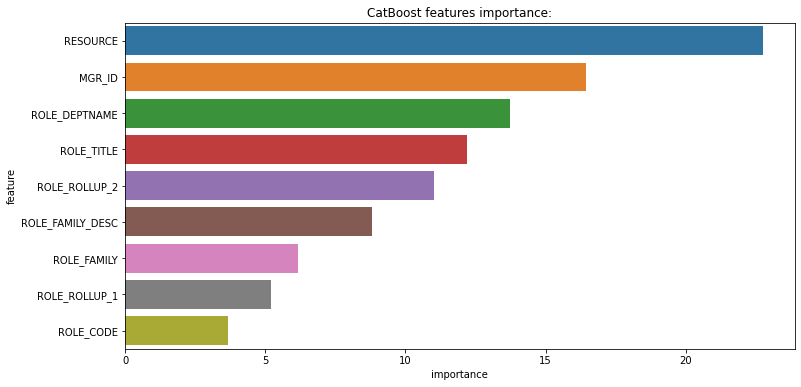

In [31]:
from matplotlib import pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6));
sns.barplot(x="importance", y="feature", data=feature_importance_df);
plt.title('CatBoost features importance:');

In [33]:
!pip install shap

     |████████████████████████████████| 327kB 22.5MB/s 
  Created wheel for shap: filename=shap-0.37.0-cp36-cp36m-linux_x86_64.whl size=463912 sha256=90f0c3f4436ce702e042297decaa8db22c1d1433cd701124742e3f547e300ee6
  Stored in directory: /root/.cache/pip/wheels/df/ad/b0/aa7815ec68850d66551ef618095eccb962c8f6022f1d3dd989
Successfully built shap


In [34]:
import shap
explainer = shap.TreeExplainer(cbc_7) # insert your model
shap_values = explainer.shap_values(train_data) # insert your train Pool object

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:100,:], X_train.iloc[:100,:])

The model has complex ctrs, so the SHAP values will be calculated approximately.


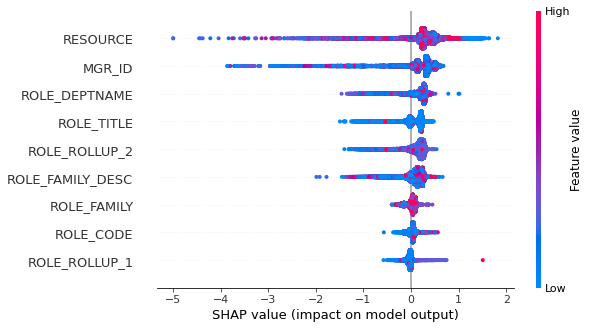

In [35]:
shap.summary_plot(shap_values, X_train)

In [36]:
%%time

from sklearn.model_selection import StratifiedKFold

n_fold = 4 # amount of data folds
folds = StratifiedKFold(n_splits=n_fold, shuffle=True, random_state=SEED)

params = {'loss_function':'Logloss',
          'eval_metric':'AUC',
          'verbose': 200,
          'random_seed': SEED
         }

test_data = Pool(data=X_test,
                 cat_features=cat_features)

scores = []
prediction = np.zeros(X_test.shape[0])
for fold_n, (train_index, valid_index) in enumerate(folds.split(X, y)):
    
    X_train, X_valid = X.iloc[train_index], X.iloc[valid_index] # train and validation data splits
    y_train, y_valid = y[train_index], y[valid_index]
    
    train_data = Pool(data=X_train, 
                      label=y_train,
                      cat_features=cat_features)
    valid_data = Pool(data=X_valid, 
                      label=y_valid,
                      cat_features=cat_features)
    
    model = CatBoostClassifier(**params)
    model.fit(train_data,
              eval_set=valid_data, 
              use_best_model=True
             )
    
    score = model.get_best_score()['validation_0']['AUC']
    scores.append(score)
    y_pred = model.predict_proba(test_data)[:, 1]
    prediction += y_pred

prediction /= n_fold
print('CV mean: {:.4f}, CV std: {:.4f}'.format(np.mean(scores), np.std(scores)))

Learning rate set to 0.109208
0:	test: 0.5465820	best: 0.5465820 (0)	total: 113ms	remaining: 1m 52s
200:	test: 0.8610416	best: 0.8614138 (148)	total: 21.1s	remaining: 1m 23s
400:	test: 0.8624799	best: 0.8625407 (390)	total: 43s	remaining: 1m 4s
600:	test: 0.8649257	best: 0.8649312 (598)	total: 1m 4s	remaining: 42.6s
800:	test: 0.8667353	best: 0.8667569 (796)	total: 1m 24s	remaining: 21.1s
999:	test: 0.8682379	best: 0.8682414 (998)	total: 1m 46s	remaining: 0us

bestTest = 0.8682414315
bestIteration = 998

Shrink model to first 999 iterations.
Learning rate set to 0.109209
0:	test: 0.5000000	best: 0.5000000 (0)	total: 44.5ms	remaining: 44.4s
200:	test: 0.8902151	best: 0.8909280 (126)	total: 21.2s	remaining: 1m 24s
400:	test: 0.8935457	best: 0.8935466 (399)	total: 43.8s	remaining: 1m 5s
600:	test: 0.8953407	best: 0.8953899 (598)	total: 1m 5s	remaining: 43.4s
800:	test: 0.8965207	best: 0.8965207 (800)	total: 1m 26s	remaining: 21.6s
999:	test: 0.8971489	best: 0.8976144 (900)	total: 1m 47s	r